In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader as DataLoader
%matplotlib inline
import matplotlib.pyplot as plt
import gdown
import zipfile
import os

In [ ]:
# CONSTANTS
BATCH_SIZE = 128
LATENT_VECTOR_DIM = 100  # wymiar szumu, z którego generator tworzy obrazy
LEARNING_RATE = 1e-3
NUM_EPOCHS = int(input("How many training epochs to perform (Recommended - 5-10 for CelebA and at the very least 10 for LFW)"))
train_choice = input("You wish to load (L) or train (T) the model from scratch?")
if train_choice.upper() == "T":
    train_choice = True
elif train_choice.upper() == "L":
    train_choice = False
else:
    raise ValueError("You have entered an invalid choice - you can either train (T) or load (L) the model. Please try again.")

REMOVE_SOME_PHOTOS = True
"""If true, photos tagged with some categories, like 'has glasses' will be removed from the dataset"""

## Skorzystamy ze zbioru danych CelebA dostępnego w bibliotece torchvision.


Zawiera ponad 200,000 różnych kolorowych zdjęć twarzy należących do ponad 10,000 osób. Dane w zbiorze są zapisane w formie obrazów, aby je wykorzystać sprowadza się je do tensorów używając transformacji.  W dodatku każdy z obrazów jest opisany 40 binarnymi atrybutami, jak na przykład "Nosi okulary" czy "Ma wąsy" co jest przydatne, jeżeli chcemy uzyskać sieć generującą określone rodzaje twarzy.


In [ ]:
celeba_zip_url = "https://drive.google.com/uc?id=16f9EWHeScK4j7aXH6P1it1hqSakrIell&export=download"
celeba_dataset_path = "data/CelebA"
if os.path.exists("data/CelebA.zip"):
    print("Celeba already downloaded")
else:
    if not os.path.exists("data"):
        os.mkdir("data")
    print("Downloading celeba dataset archive")
    gdown.download(celeba_zip_url, output="data/CelebA.zip", quiet=False)
if os.path.exists("data/CelebA"):
    print("Celeba already extracted")
else:
    print("Extracting celeba from zip...")
    with zipfile.ZipFile("data/CelebA.zip", "r") as zip_archive:
        zip_archive.extractall("data")

GENERATOR_PATH = "models/DC_generator.pth"
DISCRIMINATOR_PATH = "models/DC_discriminator.pth"
if not os.path.exists("models"):
    os.mkdir("models")
dataset = torchvision.datasets.CelebA(root="data/CelebA", split="all", download=False, transform=transforms.ToTensor())




Celeba already downloaded
Celeba already extracted
Files already downloaded and verified


### Zbiór CelebA zawiera wiele bardzo różnych twarzy

Aby wspomóc trening naszego modelu postaramy się wybrać twarze bez atrybutów, które mogą "zaburzać" proces uczenia, jak na przykład okulary czy nakrycia głowy.

Na początek wypiszmy dostępne atrybuty i ich indeksy:

Spróbujmy wyrzucić zdjęcia twarzy z atrybutami zewnętrznymi - okulary, nakrycia głowy, makijaż.

Usuniemy także obrazy oznaczone etykietą "blurry" ponieważ zawierają mniej detali i mogą wprowadzać niepotrzebny szum

In [ ]:
if REMOVE_SOME_PHOTOS is True:
    celeba_attrs = dataset.attr_names
    celeba_attrs_indexes = {attr: idx for idx, attr in enumerate(celeba_attrs)}
    print(celeba_attrs_indexes)
    removed_attributes = ["Blurry", "Wearing_Hat", "Eyeglasses", "Heavy_Makeup"]
    removed_attrs_indexes = [celeba_attrs_indexes[attr] for attr in removed_attributes]
    print(removed_attrs_indexes)
    # obrazy, dla których wszystkie niepożądane przez nas atrybuty mają wartość 0
    not_removed_indices = (dataset.attr[:, removed_attrs_indexes] == 0).all(dim=1).nonzero(as_tuple=True)[0]
    whole_dataset = torch.utils.data.Subset(dataset, not_removed_indices)

else:
    whole_dataset = dataset

print(f"Długość zbioru danych: {len(whole_dataset)}")


{'5_o_Clock_Shadow': 0, 'Arched_Eyebrows': 1, 'Attractive': 2, 'Bags_Under_Eyes': 3, 'Bald': 4, 'Bangs': 5, 'Big_Lips': 6, 'Big_Nose': 7, 'Black_Hair': 8, 'Blond_Hair': 9, 'Blurry': 10, 'Brown_Hair': 11, 'Bushy_Eyebrows': 12, 'Chubby': 13, 'Double_Chin': 14, 'Eyeglasses': 15, 'Goatee': 16, 'Gray_Hair': 17, 'Heavy_Makeup': 18, 'High_Cheekbones': 19, 'Male': 20, 'Mouth_Slightly_Open': 21, 'Mustache': 22, 'Narrow_Eyes': 23, 'No_Beard': 24, 'Oval_Face': 25, 'Pale_Skin': 26, 'Pointy_Nose': 27, 'Receding_Hairline': 28, 'Rosy_Cheeks': 29, 'Sideburns': 30, 'Smiling': 31, 'Straight_Hair': 32, 'Wavy_Hair': 33, 'Wearing_Earrings': 34, 'Wearing_Hat': 35, 'Wearing_Lipstick': 36, 'Wearing_Necklace': 37, 'Wearing_Necktie': 38, 'Young': 39, '': 40}
[10, 35, 15, 18]
Długość zbioru danych: 95812


Zwizualizujmy najpierw kilka twarzy z tego zbioru:

image shape: torch.Size([3, 218, 178])


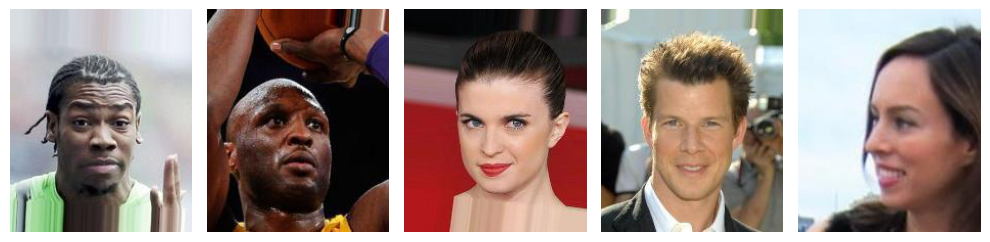

In [ ]:
my_rng = torch.Generator()
my_rng.manual_seed(42)
rand_indexes = torch.randint(len(whole_dataset), size=(5,), generator=my_rng)
imgs = [whole_dataset[idx][0] for idx in rand_indexes]
print(f"image shape: {whole_dataset[0][0].shape}")  # (3, 250, 250)
imgs = [torch.permute(image, [1,2,0]) for image in imgs] # funkcja imshow oczekuje kanałów na końcu: (250, 250, 3)
# plotting the images
fig, ax = plt.subplots(1, 5, figsize=(10,5))
for ax, img in zip(ax, imgs):
    ax.imshow(img)
    ax.axis('off')  # Wyłącza osie dla lepszego wyglądu obrazków

plt.tight_layout()
plt.show()


Zbiór powininien zostać nie tylko przekształcony do tensorów, ale także **znormalizowany** - nie zrobiono tego wcześniej, ponieważ zaburza to graficzny wygląd twarzy (kolorów). Należy pamiętać, że whole_dataset to podzbiór oryginalnego zbioru danych i to na oryginalnym zbiorze danych trzeba zmienić transformację, nie na podzbiorze

Ponadto zmniejszymy rozdzielczość naszych twarzy, ponieważ (przynajmniej na razie) 250x250 to zbyt dużo dla naszego generatora. Twarze zmniejszymy do 64x64 używając transormacji Resize oraz CenterCrop jeszcze przed wczytaniem obrazów z Datasetu do tensorów.

In [ ]:
scale_to_tanh = lambda x: (x - x.min() / (x.max() - x.min())) * 2 - 1
initial_transform = transforms.Compose([
    transforms.Resize(64),  # krótsza krawędź obrazu ma 64px
    transforms.CenterCrop(64),  # obraz jest przycięty tak, żeby był kwadratowy (samo użycie Resize go zmniejsza nie zaburzając proporcji)
    transforms.ToTensor(),
    transforms.Lambda(scale_to_tanh),
])
dataset.transform = initial_transform  # nie definiujemy transformacji dla subsetu, tylko dla oryginalnego datasetu!

Oczywiście wygląd kolorów po znormalizowaniu jest inny:

Zwracam tutaj osobiście szczególną uwagę na komunikaty wypisywane przez funkcję imshow - po znormalizowaniu te wartości są od -1 do +1, czyli w danych treningowych piksele mogą przyjmować ujemne wartości! Nie jest to intuicyjne, jednak pomaga przy treningu sieci ponieważ Tanh ma generalnie "lepszy" gradient niż zwykły sigmoid. Dlaczego "osobiście" zwracam na to uwagę? Ponieważ na początku dałem na koniec mojego generatora sigmoid i byłem zdziwiony, że mu nie idzie...

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99215686..0.99215686].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.60784316].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9764706..0.9137255].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99215686].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9372549..1.0].


image shape: torch.Size([3, 64, 64])


<Figure size 640x480 with 0 Axes>

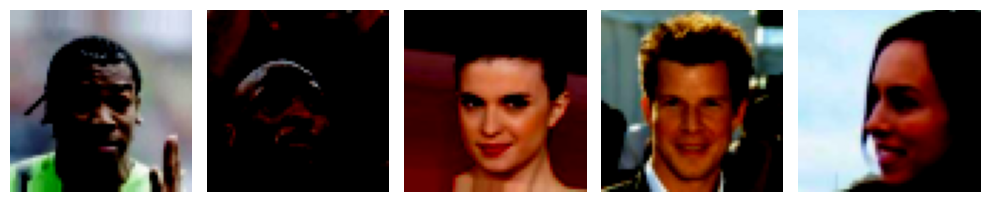

In [ ]:
plt.clf()
imgs = [whole_dataset[idx][0] for idx in rand_indexes]
imgs = [torch.permute(image, [1,2,0]) for image in imgs] # funkcja imshow oczekuje kanałów na końcu: (64, 64, 3)
# plotting the images
fig, ax = plt.subplots(1, 5, figsize=(10,5))

for ax, img in zip(ax, imgs):
    ax.imshow(img)
    ax.axis('off')

IMAGE_SHAPE = whole_dataset[0][0].shape
print(f"image shape: {IMAGE_SHAPE}")

uunormalized_img = imgs[0]
plt.tight_layout()
plt.show()

### Jak widać znormalizowane obrazy mają zaburzone kolory, jednak zastosowana normalizacja jest całkowicie odwracalna:

Skoro normalizacja polega na odjęciu średniej i podzieleniu przez odchylenie standardowe, aby ją odwrócić wystarczy przemnożyć przez odchylenie i dodać średnią (w tej kolejności). Ta funkcja będzie potrzebna, aby zdenormalizować kolory predykcji naszego generatora

Zdenormalizowane obrazy


<Figure size 640x480 with 0 Axes>

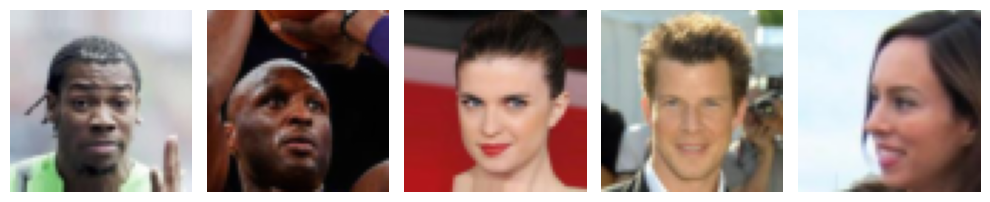

In [ ]:
def unnormalize_img(t, mean, std):
    """
    Funkcja odwracająca proces normalizacji obrazu o wymiarach (C, H, W). Każdy z C kanałów korzysta ze swojej własnej średniej i odchylenia.
    Funkcja zwraca kopię tensora, nie operuje w miejscu!"""
    output = torch.empty_like(t)
    for idx, (channel, channel_mean, channel_std) in enumerate(zip(t, mean, std)):
        output[idx] = (channel * channel_std) + channel_mean
    return output

def show_unnormalization():
    unnorm_imgs = [whole_dataset[idx][0] for idx in rand_indexes]
    unnorm_imgs = [unnormalize_img(img, MEAN, STD) for img in unnorm_imgs]
    unnorm_imgs = [torch.permute(img, [1,2,0]) for img in unnorm_imgs]
    
    plt.clf()
    fig, ax = plt.subplots(1, 5, figsize=(10,5))
    for ax, img in zip(ax, unnorm_imgs):
        ax.imshow(img)
        ax.axis('off')
    print("Zdenormalizowane obrazy")
    plt.tight_layout()
    plt.show()
show_unnormalization()

## Zbudujemy sieć według architektury Deep Convolutional GAN - z perpektywy czasu okazała się ona szczególnie skuteczna w trenowaniu sieci GAN na obrazach.


DCGAN, wprowadzona w 2015r, zamienia wszystkie warstwy liniowe na konwolucje a zamiast poolingu uzyskuje downsampling już na etapie konwolucji stosując większy stride. Zastosowanie warstw konwolucyjnych do down/upsamplingu sprawia, że sieć może się nauczyć wag tej operacji, co nie jest możliwe przy "zwykłym" poolingu.

Dyskryminator niczym nie odbiega od "standardowej" sieci konwolucyjnej stosowanej do klasyfikacji obrazów, żadnych fajerwerków.
Wiele praktyk, jak obliczanie funkcji aktywacji in-place czy pomijanie biasów w dyskryminatorze jest zaczerpnięte z badania pierwszy raz wprowadzającego architekturę DCGAN - [A. Radford, L. Metz, and S. Chintala. Unsupervised representation learning with deep convolutional generative adversarial networks.* z 2016r](https://arxiv.org/abs/1511.06434v2).

Cytując to badanie:

> Architecture guidelines for stable Deep Convolutional GANs
> - Replace any pooling layers with strided convolutions (discriminator) and fractional-strided
convolutions (generator).
> - Use batchnorm in both the generator and the discriminator [except output of generator and input of discriminator].
> - Remove fully connected hidden layers for deeper architectures.
> - Use ReLU activation in generator for all layers except for the output, which uses Tanh.
> - Use LeakyReLU activation in the discriminator for all layers.

Z dokumentacji PyTorch https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html można odczytać, jaki kształt ma obraz po przejściu przez jedną warstwę Conv2d. Ponieważ nasz obraz jest kwadratowy, nie używamy dylatacji (domyślna=1) a nasze kernel, stride i padding są kwadratowe (domyślne zachowanie gdy podany jest jeden skalar) to wyrażenie sprowadza się do:

`W_out = H_out = (H_in + 2 * padding - (kernel_size - 1) - 1) / stride + 1 = (H_in + 2 * padding - kernel_size) / stride + 1`

In [1]:
class DCDiscriminator(nn.Module):
    def __init__(self):
        super(DCDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Dropout(p=0.20),  # użycie dropout przy trenowaniu dyskryminatora sprawi, że mniej będzie 'zapamiętywał' konkretne twarze

            # stride > 1 powoduje downsampling bez zastosowania poolingu. Doprowadzamy tutaj obraz ze 64 x 64 do 1x1
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.model(x)

NameError: name 'nn' is not defined

**W klasie generatora dokonuje się upsamplingu, czyli z obrazu 1x1 stopniowo generuje się obraz o pożądanej wielkości. W tym celu stosuje się tzw. fractionally-strided convolutions**, czasami błędnie określane jako dekonwolucje (intuicyjnie ta operacja faktycznie ma działanie przeciwstawne do konwolucji, jednak **implementacja w PyTorch nie jest dokładnie operacją odwrotną do zwykłej konwolucji**). W PyTorch fractionally-strided convolution jest zaimplementowane w warstwie ConvTranspose. Dobra wizualizacja fractionally-strided convolutions: https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md

Z dokumentacji PyTorch https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html można odczytać kształt obrazu generowanego przez jedną taką warstwę. Ponieważ nasz obraz jest kwadratowy i nie używamy tutaj dylatacji(domyślna=1) ani output_paddingu(domyślny=0) a stride, kernel oraz padding są kwadratowe (domyślne zachowanie, gdy poda się tylko jeden skalar), to wyrażenie się sprowadza do:

`W_out = H_out = (H_in - 1) * stride - 2 * padding + (kernel_size - 1) + 1 = (H_in - 1) * stride - 2 * padding + kernel_size`


In [ ]:
class DCGenerator(nn.Module):
    def __init__(self):
        super(DCGenerator, self).__init__()
        self.model = nn.Sequential(
            # na chwilę obecną wartości kernel i stride są dobrane tak, aby obraz wyjściowy miał wymiar dokładnie 128x128
            nn.ConvTranspose2d(in_channels=LATENT_VECTOR_DIM, out_channels=1024, kernel_size=4, stride=1, padding=0, bias=False),  # 4x4
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),  # (...) x 8x8
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False), # (...) x 16x16
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False), # (...) x 32 x 32
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=128, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False), # (...) x 64 x 64
            nn.Tanh()  # Tanh a nie sigmoid, ponieważ niektóre piksele mogą przyjmować ujemne wartości (z powodu tego, jak znormalizowane są dane)
        )
    def forward(self,x):
        return self.model(x)


Autorzy artykułu wprowadzającego po raz pierwszy DCGan zwracają uwagę, że szczególnie dobrze działało dla nich **inicjalizowanie wag rozkładem normalnym z odchyleniem standardowym 0.02 i wartością oczekiwaną 0 dla warstw konwolucyjnych oraz 1 dla warstw BatchNorm**. Stwórzmy funkcję, która pozwoli w taki sposób zainicjalizować wagi dowolnej sieci neuronowej i zainicjalizujmy nią nasze sieci. Wadą skorzystania z tej funkcji jest niestety utrudnienie korzystania z LazyLayers, co spowoduje nieco więcej pisaniny przy eksperymentowaniu z modelem

In [ ]:
conv_mean = 0.0
conv_deviation = 0.02
norm_mean = 1.0
norm_deviation = 0.02
def weights_init_gaussian(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, conv_mean, conv_deviation)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, norm_mean, norm_deviation)
        nn.init.constant_(m.bias.data, 0)

Do treningu trzeba oczywiście stworzyć instancje generatora i dyskryminatora oraz ich optimizery. W sieciach GAN często używaną funkcją straty jest Binary Cross Entropy Loss, funkcja idealna w przypadku problemów klasyfikacji binarnej, a właśnie z tym mierzy się dyskryminator. Jeżeli dostępne jest CUDA, to wykorzystanie możliwości kart graficznych zazwyczaj przyspiesza trening o rzędy wielkości.

Jeżeli chcemy wczytać modele, to musimy najpierw utworzyć ich instancje i następnie załadować same wagi. Ładowanie czegokolwiek więcej niż samych wag jest bardzo niezalecane ponieważ pickler używany do ładowania może wtedy wykonać złośliwy kod zaszyty w pliku z modelem.


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

generator = DCGenerator().to(device=device)
discriminator = DCDiscriminator().to(device=device)
if train_choice is True:
    generator.apply(weights_init_gaussian)
    discriminator.apply(weights_init_gaussian)
else:
    generator.load_state_dict(torch.load(GENERATOR_PATH, weights_only=True))
    discriminator.load_state_dict(torch.load(DISCRIMINATOR_PATH, weights_only=True))

# przełącza modele w tryb treningu. Jest to zachowanie domyślne, ale "explicit is better than implicit" :)
generator.train()
discriminator.train()

optim_G = torch.optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
optim_D = torch.optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
loss_fn = nn.BCELoss()


Using cuda device


#### Ostatnim krokiem przed rozpoczęciem treningu jest zainicjalizowanie DataLoadera. Jeżeli korzystamy z CUDA dobrze jest utworzyć DataLoader z parametrem pin_memory=True. Spowoduje to, że dane zwrócone przez taki Loader będzie można szybciej przenieść z CPU na GPU

In [ ]:
should_pin_memory = torch.cuda.is_available()
dataloader = DataLoader(dataset=whole_dataset, batch_size=BATCH_SIZE, shuffle=True, pin_memory=should_pin_memory, num_workers=2)

#### Utwórzmy także pewien zestaw twarzy, na którym będziemy sprawdzać skuteczność modelu podczas treningu

In [ ]:
len_dataloader = len(dataloader)
faces_per_check = 8
""" ile twarzy jest sprawdzane przy wizualizowaniu postępów generatora"""
my_fixed_noise = torch.randn(faces_per_check, LATENT_VECTOR_DIM, 1, 1, device=device)
the_real_faces  = [whole_dataset[idx][0].to(device=device) for idx in rand_indexes]
my_real_faces = torch.stack(the_real_faces, dim=0)  # stack łączy tensory z tej listy wzdłuż nowego wymiaru dim
fixed_face_results = torch.zeros(NUM_EPOCHS,4, faces_per_check,  *IMAGE_SHAPE)  # będzie przechowywać po 20 twarzy z każdej epoki - aby obserwować postęp treningu

#### Aby skrócić kod pętli treningowej zdefiniujemy funkcję oceniającą postępy treningu wcześniej

In [ ]:
def evaluate_progress(gen, disc, my_noise, the_real_faces):
    plt.clf()
    _, ax = plt.subplots(1, faces_per_check, figsize=(2.5 * faces_per_check, 5))
    gen.eval()
    disc.eval()
    with torch.inference_mode():
        test_images = gen(my_noise)
        for (img, ax) in zip(test_images, ax):
            img = unnormalize_img(img, MEAN, STD)
            ax.imshow(img.cpu().permute(1, 2, 0))
        plt.show()

        print(f"Does discriminator think real faces are real?", end=" ")
        real_faces_results = disc(the_real_faces)
        for face_result in real_faces_results:
            print(f"{face_result.item():.4f}", end=" ")
        print(f"\nDoes discriminator think fake faces are real?", end=" ")
        fake_faces_results = disc(test_images)
        for fake_face in fake_faces_results:
             print(f"{fake_face.item():.4f}", end=" ")

        real_labels = torch.ones((faces_per_check, 1, 1, 1), device=device)
        print(f"\nMean generator loss: {loss_fn(disc(test_images.detach()), real_labels) / faces_per_check:.4f}")
    gen.train()
    disc.train()


#### Pętla treningowa jest dość standardowa - jedyną różnicą jest to, że ćwiczymy dwie sieci jednocześnie. W jednej iteracji ćwiczymy najpierw dyskryminator, a potem generator.

Epoch 0: ####################

<Figure size 640x480 with 0 Axes>

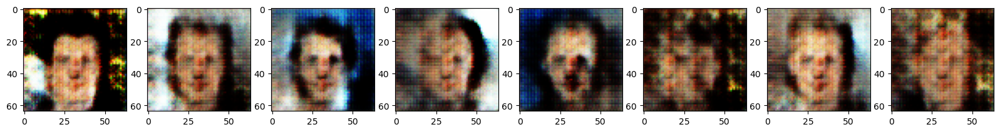

Does discriminator think real faces are real? 0.7243 0.3923 0.6334 0.1936 0.4805 
Does discriminator think fake faces are real? 0.5067 0.3861 0.9446 0.1833 0.1597 0.5290 0.1645 0.4046 
Mean generator loss: 0.1338
Epoch 1: ####################

<Figure size 640x480 with 0 Axes>

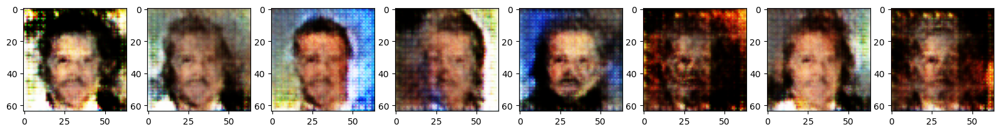

Does discriminator think real faces are real? 0.5076 0.8101 0.5144 0.4492 0.6312 
Does discriminator think fake faces are real? 0.4940 0.3214 0.0600 0.5912 0.2581 0.5639 0.4995 0.6648 
Mean generator loss: 0.1283
Epoch 2: ####################

<Figure size 640x480 with 0 Axes>

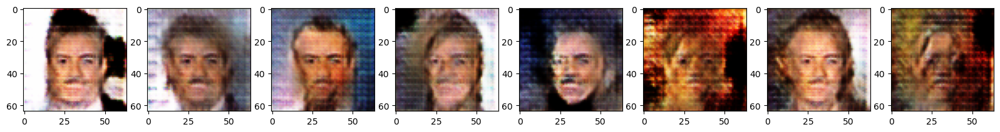

Does discriminator think real faces are real? 0.2141 0.6561 0.6345 0.1974 0.7802 
Does discriminator think fake faces are real? 0.3695 0.2977 0.3218 0.4374 0.2321 0.4579 0.3806 0.4693 
Mean generator loss: 0.1271
Epoch 3: ####################

<Figure size 640x480 with 0 Axes>

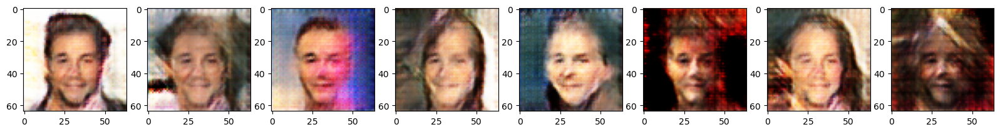

Does discriminator think real faces are real? 0.6160 0.8386 0.8160 0.5915 0.6747 
Does discriminator think fake faces are real? 0.5063 0.7583 0.6173 0.6071 0.4508 0.7181 0.7958 0.7760 
Mean generator loss: 0.0554
Epoch 4: ####################

<Figure size 640x480 with 0 Axes>

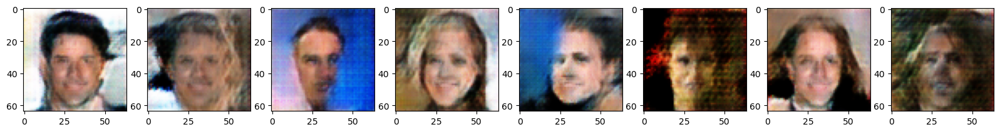

Does discriminator think real faces are real? 0.7506 0.9281 0.4565 0.3615 0.9359 
Does discriminator think fake faces are real? 0.4732 0.3632 0.9366 0.4140 0.9048 0.5872 0.5558 0.5910 
Mean generator loss: 0.0696
Epoch 5: ####################

<Figure size 640x480 with 0 Axes>

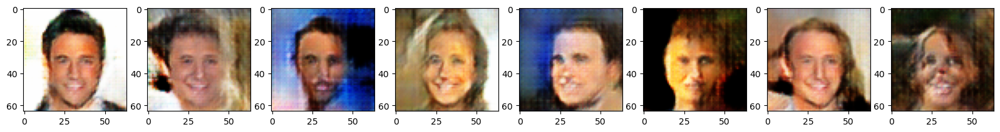

Does discriminator think real faces are real? 0.5252 0.9642 0.8768 0.6597 0.8472 
Does discriminator think fake faces are real? 0.5735 0.7332 0.9873 0.6298 0.9413 0.8882 0.6966 0.8699 
Mean generator loss: 0.0316
Epoch 6: ####################

<Figure size 640x480 with 0 Axes>

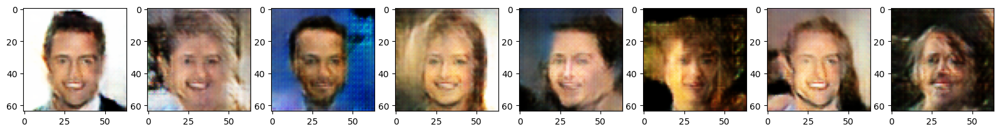

Does discriminator think real faces are real? 0.9050 0.9225 0.8494 0.6607 0.9351 
Does discriminator think fake faces are real? 0.9737 0.5600 0.9280 0.4945 0.7812 0.8385 0.7401 0.7605 
Mean generator loss: 0.0372
Epoch 7: ####################

<Figure size 640x480 with 0 Axes>

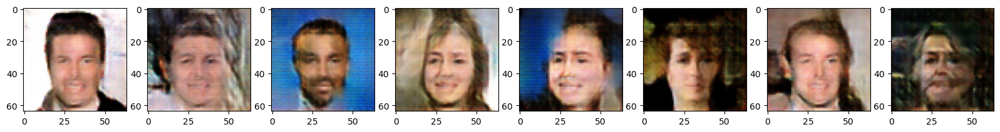

Does discriminator think real faces are real? 0.5331 0.8380 0.8215 0.5656 0.9680 
Does discriminator think fake faces are real? 0.7157 0.4839 0.1318 0.5720 0.6025 0.8699 0.6258 0.7327 
Mean generator loss: 0.0792
Epoch 8: ####################

<Figure size 640x480 with 0 Axes>

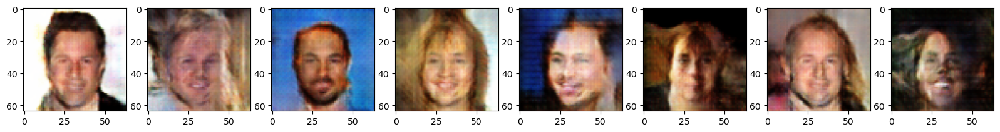

Does discriminator think real faces are real? 0.8482 0.9478 0.8784 0.3727 0.8663 
Does discriminator think fake faces are real? 0.7592 0.5505 0.8679 0.5309 0.4308 0.9514 0.7451 0.8851 
Mean generator loss: 0.0462
Epoch 9: ####################

<Figure size 640x480 with 0 Axes>

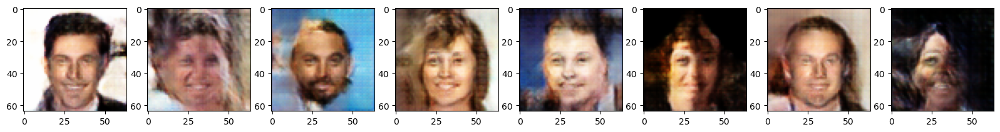

Does discriminator think real faces are real? 0.6415 0.8148 0.6620 0.5468 0.7311 
Does discriminator think fake faces are real? 0.4249 0.7576 0.9558 0.7246 0.6256 0.8872 0.6800 0.7190 
Mean generator loss: 0.0438


In [ ]:
for epoch in range(NUM_EPOCHS):
    print(f"Epoch {epoch}: ", end="")
    inner_counter = 0
    for i, (images, _) in enumerate(dataloader):  # odrzucamy etykiety identyfikujące poszczególne twarze
        # Przenosi tensor na urządzenie docelowe. Jeżeli już się na nim znajduje (czyli de facto jeśli pracujemy na CPU) to nie
        # wywołuje żadnego działania
        images = images.to(device=device)

        discriminator.zero_grad()

        # prawdziwe obrazy
        real_imgs = images
        real_labels = torch.ones(images.shape[0], 1, 1, 1, device=device)  # images.shape[0] to rozmiar jednego batcha, jednak użycie imgs.shape[0] zamiast sztywnego BATCH_SIZE uodparnia ten kod na przypadek, gdy jakiś batch jest niepełny
        output_real = discriminator(real_imgs)
        discriminator_loss_real = loss_fn(output_real, real_labels)
        # discriminator_loss_real.backward()  # oblicza gradient dla prawdziwych twarzy

        # wygenerowane obrazy
        noise = torch.randn((images.shape[0], LATENT_VECTOR_DIM, 1, 1), device=device)  # (batch, wymiar szumu, obraz 1x1)
        fake_imgs = generator(noise)
        fake_labels = torch.zeros(images.shape[0], 1, 1, 1, device=device)
        output_fake = discriminator(fake_imgs.detach())  # używamy .detach() ponieważ nie chcemy, aby ocena dyskryminatora wpłynęła
        # na gradienty ocenianych obrazów - będą one oceniane jeszcze drugi raz przy ćwiczeniu generatora
        discriminator_loss_fake = loss_fn(output_fake, fake_labels)
        # discriminator_loss_fake.backward()  # gradienty są w tym samym miejscu (czyli wagach dyskryminatora) co gradienty z prawdziwych obrazów, więc same się akumulują
        # aktualizacja parametrów dyskryminatora
        discriminator_loss_total = discriminator_loss_real + discriminator_loss_fake
        discriminator_loss_total.backward()
        optim_D.step()

        # próba oszukania dyskryminatora 'podrabianymi' obrazami
        generator.zero_grad()

        # dopiero co uaktualniliśmy dyskryminator na tej partii podrabianych obrazów - generator zawsze ma nieco trudniej ponieważ
        # gdzieś w wagach dyskryminatora już jest zaszyta informacja (albo raczej jej skrawek - używamy bardzo małego learning rate)
        # że te obrazy powinny być fałszywe.
        # tutaj NIE WOLNO użyć .detach() ponieważ odłączy to generator od grafu komputacji fałszywych obrazów!
        output_discriminator = discriminator(fake_imgs)
        real_labels = torch.ones(images.shape[0], 1, 1, 1, device=device)
        generator_loss = loss_fn(output_discriminator, real_labels)

        # aktualizacja parametrów generatora
        generator_loss.backward()
        optim_G.step()

        if i % (len_dataloader // 20) == (len_dataloader // 20) - 1:
            print("#", end="")

        # zapisuje do fixed_face_results postęp treningu cztery razy w ciągu jednej epoki
        if i % (len_dataloader // 4) == (len_dataloader // 4) - 1:
            with torch.inference_mode():
                generator.eval()
                fixed_face_results[epoch, inner_counter] = generator(my_fixed_noise)
                generator.train()
            inner_counter += 1
    torch.save(generator.state_dict(), GENERATOR_PATH)
    torch.save(discriminator.state_dict(), DISCRIMINATOR_PATH)

    evaluate_progress(generator, discriminator, my_fixed_noise, my_real_faces)



Po wytrenowaniu naszego generatora zwizualizujmy jego działanie. Sprawdźmy także, co o obrazach z generatora sądzi dyskryminator.

Sieci zostaną przełączone w tryb eval() - wpływa on na zachowanie niektórych warstw, które działają inaczej podczas treningu a inaczej podczas stosowania modelu. W szczególności nas interesuje fakt, że eval() dezaktywuje warstwy Dropout w dyskryminatorze oraz zmienia działanie warstw BatchNorm w generatorze.

Zastosowany jest także inference_mode - jest on używany gdy nie zależy nam na uczeniu sieci, tylko na jej zastosowaniu. W inference mode wiele rzeczy (m.in. gradienty) koniecznych do treningu nie jest obliczane/śledzone.

<Figure size 640x480 with 0 Axes>

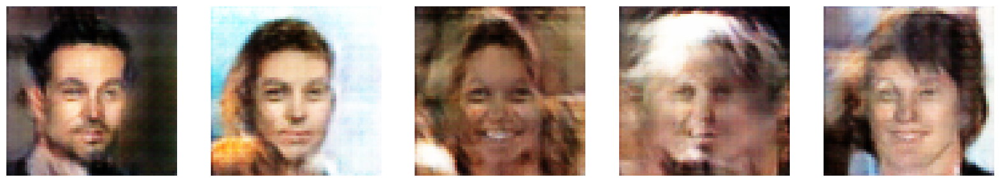

Discriminator's opinion: 
Probability that face 0 is real: 0.65380
Probability that face 1 is real: 0.64827
Probability that face 2 is real: 0.59175
Probability that face 3 is real: 0.65036
Probability that face 4 is real: 0.68619
Opinions on faces from the dataset
Probability that face with index 49874 is real: 0.64149
Probability that face with index 62795 is real: 0.81476
Probability that face with index 66872 is real: 0.66205
Probability that face with index 80150 is real: 0.54681
Probability that face with index 10870 is real: 0.73106


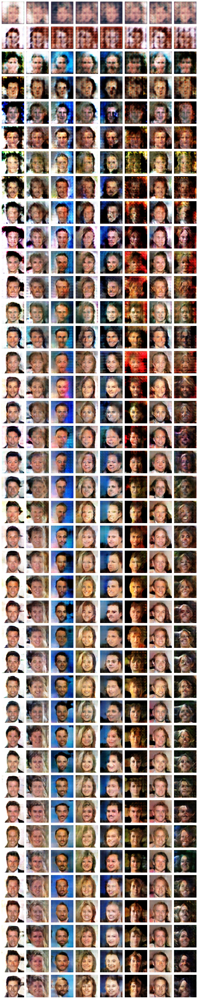

In [ ]:
noise = torch.randn((5, LATENT_VECTOR_DIM, 1, 1), device=device)
discriminator.eval()
generator.eval()
with torch.inference_mode():
    my_fake_faces = generator(noise)
    discriminator_output = discriminator(my_fake_faces)
my_fake_faces_list = [unnormalize_img(face, MEAN, STD) for face in my_fake_faces.cpu()]
plt.clf()
fig, ax = plt.subplots(1, 5, figsize=(4 * 5,10))
for ax, face in zip(ax, my_fake_faces_list):
    ax.imshow(torch.permute(face, (1, 2, 0)))
    ax.axis('off')

plt.show()
print("Discriminator's opinion: ")
for i in range(len(my_fake_faces)):
    print(f"Probability that face {i} is real: {discriminator_output[i].item():.5f}")

print("Opinions on faces from the dataset")

with torch.inference_mode():
    for idx in rand_indexes:
        face = whole_dataset[idx][0].to(device=device).unsqueeze(0)
        print(f"Probability that face with index {idx} is real: {discriminator(face).item():.5f}")

if NUM_EPOCHS > 0:
    _, all_axes = plt.subplots(NUM_EPOCHS * 4, faces_per_check, figsize=(1.5 * faces_per_check, NUM_EPOCHS * 4 * 1.5))
    fixed_face_results_forimshow = fixed_face_results.view(NUM_EPOCHS * 4, faces_per_check, *IMAGE_SHAPE)
    for (one_faces_set, one_axes_set) in zip(fixed_face_results_forimshow, all_axes):
        for (one_face, one_ax) in zip(one_faces_set, one_axes_set):
            one_face = unnormalize_img(one_face, STD, MEAN)
            one_ax.imshow(one_face.detach().cpu().permute(1, 2, 0))
            one_ax.axis('off')
    plt.tight_layout()
    plt.show()